In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

PROJECT_DIR = "/content/drive/MyDrive/PaveXa_Indian_Finetune"

os.makedirs(PROJECT_DIR, exist_ok=True)
os.makedirs(f"{PROJECT_DIR}/models", exist_ok=True)
os.makedirs(f"{PROJECT_DIR}/checkpoints", exist_ok=True)
os.makedirs(f"{PROJECT_DIR}/runs", exist_ok=True)
os.makedirs(f"{PROJECT_DIR}/metrics", exist_ok=True)

print("Project directory created:")
print(PROJECT_DIR)

Project directory created:
/content/drive/MyDrive/PaveXa_Indian_Finetune


In [ ]:
!pip install -q kagglehub

In [ ]:
import kagglehub

dataset_path = kagglehub.dataset_download(
    "muskanverma24/pothole-detection-dataset-yolov11-optimized"
)

print("Dataset downloaded to:")
print(dataset_path)

100%|██████████| 215M/215M [00:02<00:00, 104MB/s] 

Extracting files...


Dataset downloaded to:
/root/.cache/kagglehub/datasets/muskanverma24/pothole-detection-dataset-yolov11-optimized/versions/1


In [ ]:
import os

for root, dirs, files in os.walk(dataset_path):
    level = root.replace(dataset_path, "").count(os.sep)

    if level <= 2:
        indent = "  " * level
        print(f"{indent}{os.path.basename(root)}/")

1/
  test/
    images/
    labels/
  train/
    images/
    labels/
  valid/
    images/
    labels/


In [ ]:
import os

yaml_path = os.path.join(dataset_path, "data.yaml")

print("data.yaml exists:", os.path.exists(yaml_path))
print("\n--- data.yaml ---\n")

with open(yaml_path, "r") as f:
    print(f.read())

data.yaml exists: True

--- data.yaml ---

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 1
names: ['pothole']

roboflow:
  workspace: vasanthakumar662005
  project: pothole-pq3lu
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/vasanthakumar662005/pothole-pq3lu/dataset/1


In [ ]:
import os

label_dir = os.path.join(dataset_path, "train", "labels")

label_files = [
    f for f in os.listdir(label_dir)
    if f.endswith(".txt")
]

print("Number of training label files:", len(label_files))

print("\n--- Sample annotations ---")

for filename in label_files[:5]:
    path = os.path.join(label_dir, filename)

    print(f"\n{filename}")

    with open(path, "r") as f:
        lines = f.readlines()

    for line in lines[:5]:
        print(line.strip())

Number of training label files: 3345

--- Sample annotations ---

137_jpg.rf.2532c8b0d192100ad0393dc5862d57d8.txt
0 0.40390625 0.209375 0.8078125 0.40859375

potholes413_png.rf.75db9576c5eb169dd8c733fe93246c07.txt
0 0.68984375 0.6203125 0.5171875 0.53359375

potholes285_png.rf.5944ae1e055b1f2fdfd3eee38065046c.txt
0 0.53125 0.4203125 0.290625 0.31953125

337_jpg.rf.34c2eb7199b4f3bd7bc25a3eaf42dc85.txt
0 0.4984375 0.44609375 0.996875 0.3421875

potholes542_png.rf.5f215507cf5fe4ef39cc591ddbdc883e.txt
0 0.51328125 0.34765625 0.71875 0.69453125
0 0.5625 0.7828125 0.1734375 0.115625
0 0.78984375 0.759375 0.10546875 0.0765625
0 0.80625 0.68359375 0.06015625 0.053125


In [ ]:
print("Model class mapping:")
print(model.names)

Model class mapping:


NameError: name 'model' is not defined

In [ ]:
from collections import Counter
import os

label_dir = os.path.join(dataset_path, "train", "labels")

class_counts = Counter()

for filename in os.listdir(label_dir):
    if filename.endswith(".txt"):
        with open(os.path.join(label_dir, filename), "r") as f:
            for line in f:
                parts = line.strip().split()
                if parts:
                    class_counts[int(parts[0])] += 1

print("Class counts:")
print(class_counts)

Class counts:
Counter({0: 8705})


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/best.pt")

print("Model class mapping:")
print(model.names)

FileNotFoundError: [Errno 2] No such file or directory: '/content/best.pt'

In [ ]:
!pip install -q ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 27.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.2/53.2 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.2/64.2 kB 5.5 MB/s eta 0:00:00


In [ ]:
import os

print("Files in /content:")
for f in os.listdir("/content"):
    print(f)

Files in /content:
.config
drive
yolo12m_5class_40epochs_best.pt
sample_data


In [ ]:
import glob
import os

pt_files = glob.glob("/content/*.pt")

print("PT files found:")
for path in pt_files:
    print(path)

PT files found:
/content/yolo12m_5class_40epochs_best.pt


In [ ]:
import glob
from ultralytics import YOLO

pt_files = glob.glob("/content/*.pt")

print("Found model files:")
for p in pt_files:
    print(repr(p))

model_path = pt_files[0]

print("\nLoading:")
print(model_path)

model = YOLO(model_path)

print("\nModel loaded successfully!")
print("Model class mapping:")
print(model.names)

Found model files:
'/content/yolo12m_5class_40epochs_best.pt'

Loading:
/content/yolo12m_5class_40epochs_best.pt

Model loaded successfully!
Model class mapping:
{0: 'D00', 1: 'D10', 2: 'D20', 3: 'D40', 4: 'D43'}


In [ ]:
import os
from collections import Counter

# Dataset location
label_dirs = {
    "train": os.path.join(dataset_path, "train", "labels"),
    "valid": os.path.join(dataset_path, "valid", "labels"),
    "test": os.path.join(dataset_path, "test", "labels")
}

print("Checking annotation class IDs...\n")

for split, label_dir in label_dirs.items():
    class_counts = Counter()
    total_boxes = 0
    empty_files = 0

    for filename in os.listdir(label_dir):
        if not filename.endswith(".txt"):
            continue

        filepath = os.path.join(label_dir, filename)

        with open(filepath, "r") as f:
            lines = [line.strip() for line in f if line.strip()]

        if not lines:
            empty_files += 1
            continue

        for line in lines:
            parts = line.split()

            if len(parts) >= 5:
                class_id = int(parts[0])
                class_counts[class_id] += 1
                total_boxes += 1

    print(f"--- {split.upper()} ---")
    print(f"Label files: {len([f for f in os.listdir(label_dir) if f.endswith('.txt')])}")
    print(f"Bounding boxes: {total_boxes}")
    print(f"Class distribution: {class_counts}")
    print(f"Empty label files: {empty_files}")
    print()

Checking annotation class IDs...

--- TRAIN ---
Label files: 3345
Bounding boxes: 8705
Class distribution: Counter({0: 8705})
Empty label files: 0

--- VALID ---
Label files: 397
Bounding boxes: 973
Class distribution: Counter({0: 973})
Empty label files: 0

--- TEST ---
Label files: 198
Bounding boxes: 433
Class distribution: Counter({0: 433})
Empty label files: 0



In [ ]:
import os
import shutil

# Original dataset
source_dataset = dataset_path

# New converted dataset
converted_dataset = "/content/pothole_dataset_d40"

# Create the new dataset structure
for split in ["train", "valid", "test"]:
    os.makedirs(os.path.join(converted_dataset, split, "images"), exist_ok=True)
    os.makedirs(os.path.join(converted_dataset, split, "labels"), exist_ok=True)

    # Copy images
    source_images = os.path.join(source_dataset, split, "images")
    target_images = os.path.join(converted_dataset, split, "images")

    for filename in os.listdir(source_images):
        shutil.copy2(
            os.path.join(source_images, filename),
            os.path.join(target_images, filename)
        )

    # Convert class 0 → class 3
    source_labels = os.path.join(source_dataset, split, "labels")
    target_labels = os.path.join(converted_dataset, split, "labels")

    for filename in os.listdir(source_labels):
        if not filename.endswith(".txt"):
            continue

        source_file = os.path.join(source_labels, filename)
        target_file = os.path.join(target_labels, filename)

        with open(source_file, "r") as f:
            lines = f.readlines()

        converted_lines = []

        for line in lines:
            parts = line.strip().split()

            if len(parts) >= 5:
                # Change pothole class 0 → D40 class 3
                parts[0] = "3"

            converted_lines.append(" ".join(parts) + "\n")

        with open(target_file, "w") as f:
            f.writelines(converted_lines)

print("Converted dataset created successfully!")
print(converted_dataset)


Converted dataset created successfully!
/content/pothole_dataset_d40


In [ ]:
from collections import Counter
import os

print("Checking converted dataset...\n")

for split in ["train", "valid", "test"]:
    label_dir = os.path.join(
        converted_dataset,
        split,
        "labels"
    )

    class_counts = Counter()
    total_boxes = 0

    for filename in os.listdir(label_dir):
        if not filename.endswith(".txt"):
            continue

        filepath = os.path.join(label_dir, filename)

        with open(filepath, "r") as f:
            for line in f:
                parts = line.strip().split()

                if len(parts) >= 5:
                    class_id = int(parts[0])
                    class_counts[class_id] += 1
                    total_boxes += 1

    print(f"--- {split.upper()} ---")
    print(f"Bounding boxes: {total_boxes}")
    print(f"Class distribution: {class_counts}")
    print()

Checking converted dataset...

--- TRAIN ---
Bounding boxes: 8705
Class distribution: Counter({3: 8705})

--- VALID ---
Bounding boxes: 973
Class distribution: Counter({3: 973})

--- TEST ---
Bounding boxes: 433
Class distribution: Counter({3: 433})



In [ ]:
import yaml
import os

data_yaml = {
    "path": converted_dataset,
    "train": "train/images",
    "val": "valid/images",
    "test": "test/images",
    "nc": 5,
    "names": {
        0: "D00",
        1: "D10",
        2: "D20",
        3: "D40",
        4: "D43"
    }
}

yaml_path = os.path.join(converted_dataset, "data.yaml")

with open(yaml_path, "w") as f:
    yaml.dump(data_yaml, f, sort_keys=False)

print("5-class data.yaml created successfully!")
print()
print(open(yaml_path).read())


5-class data.yaml created successfully!

path: /content/pothole_dataset_d40
train: train/images
val: valid/images
test: test/images
nc: 5
names:
  0: D00
  1: D10
  2: D20
  3: D40
  4: D43



In [ ]:
from google.colab import drive

drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os

drive_checkpoint_dir = "/content/drive/MyDrive/PaveXa_YOLOv12m_Checkpoints"

os.makedirs(drive_checkpoint_dir, exist_ok=True)

print("Checkpoint folder ready:")
print(drive_checkpoint_dir)

Checkpoint folder ready:
/content/drive/MyDrive/PaveXa_YOLOv12m_Checkpoints


In [ ]:
import os
import glob
import shutil

# Find the YOLO model automatically
pt_files = glob.glob("/content/*.pt")

print("PT files found:")
for f in pt_files:
    print(f)

# Select the model
source_model = pt_files[0]

# Drive backup location
backup_model = os.path.join(
    drive_checkpoint_dir,
    "yolov12m_5class_40epochs_best_backup.pt"
)

# Copy to Google Drive
shutil.copy2(source_model, backup_model)

# Verify
source_size = os.path.getsize(source_model)
backup_size = os.path.getsize(backup_model)

print("\nBackup completed!")
print("Original :", source_model)
print("Backup   :", backup_model)
print(f"\nOriginal size: {source_size / (1024**2):.2f} MB")
print(f"Backup size  : {backup_size / (1024**2):.2f} MB")

if source_size == backup_size:
    print("\n✅ BACKUP VERIFIED — file sizes match.")
else:
    print("\n❌ WARNING — file sizes do not match.")

PT files found:
/content/yolo12m_5class_40epochs_best.pt

Backup completed!
Original : /content/yolo12m_5class_40epochs_best.pt
Backup   : /content/drive/MyDrive/PaveXa_YOLOv12m_Checkpoints/yolov12m_5class_40epochs_best_backup.pt

Original size: 38.88 MB
Backup size  : 38.88 MB

✅ BACKUP VERIFIED — file sizes match.


In [ ]:
import os
import shutil

source_dataset = "/content/pothole_dataset_d40"
drive_dataset = "/content/drive/MyDrive/PaveXa_Indian_Pothole_Dataset"

if os.path.exists(drive_dataset):
    print("Drive dataset folder already exists.")
else:
    print("Copying dataset to Google Drive...")
    shutil.copytree(source_dataset, drive_dataset)
    print("Dataset copied successfully!")

print("\nDataset location on Drive:")
print(drive_dataset)

# Verify the important folders
for split in ["train", "valid", "test"]:
    images = os.path.join(drive_dataset, split, "images")
    labels = os.path.join(drive_dataset, split, "labels")

    print(
        f"{split}: "
        f"{len(os.listdir(images))} images, "
        f"{len(os.listdir(labels))} labels"
    )

Copying dataset to Google Drive...
Dataset copied successfully!

Dataset location on Drive:
/content/drive/MyDrive/PaveXa_Indian_Pothole_Dataset
train: 3345 images, 3345 labels
valid: 397 images, 397 labels
test: 198 images, 198 labels


In [ ]:
import os
import yaml

drive_dataset = "/content/drive/MyDrive/PaveXa_Indian_Pothole_Dataset"

drive_yaml = os.path.join(drive_dataset, "data.yaml")

data_yaml = {
    "path": drive_dataset,
    "train": "train/images",
    "val": "valid/images",
    "test": "test/images",
    "nc": 5,
    "names": {
        0: "D00",
        1: "D10",
        2: "D20",
        3: "D40",
        4: "D43"
    }
}

with open(drive_yaml, "w") as f:
    yaml.dump(data_yaml, f, sort_keys=False)

print("Persistent data.yaml created:")
print(drive_yaml)
print()
print(open(drive_yaml).read())

Persistent data.yaml created:
/content/drive/MyDrive/PaveXa_Indian_Pothole_Dataset/data.yaml

path: /content/drive/MyDrive/PaveXa_Indian_Pothole_Dataset
train: train/images
val: valid/images
test: test/images
nc: 5
names:
  0: D00
  1: D10
  2: D20
  3: D40
  4: D43



In [ ]:
import torch

print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    print("CUDA version:", torch.version.cuda)
else:
    print("❌ GPU NOT AVAILABLE")

PyTorch version: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4
CUDA version: 12.8


In [ ]:
from google.colab import drive
import os

# Mount Google Drive
drive.mount("/content/drive")

# Persistent locations
checkpoint_dir = "/content/drive/MyDrive/PaveXa_YOLOv12m_Checkpoints"
dataset_dir = "/content/drive/MyDrive/PaveXa_Indian_Pothole_Dataset"

model_backup = os.path.join(
    checkpoint_dir,
    "yolov12m_5class_40epochs_best_backup.pt"
)

dataset_yaml = os.path.join(dataset_dir, "data.yaml")

print("\n--- PaveXa Persistent Storage Check ---")

print("Model backup exists:", os.path.exists(model_backup))
print("Dataset exists:", os.path.exists(dataset_dir))
print("data.yaml exists:", os.path.exists(dataset_yaml))

if os.path.exists(model_backup):
    size_mb = os.path.getsize(model_backup) / (1024**2)
    print(f"Model backup size: {size_mb:.2f} MB")

if os.path.exists(dataset_dir):
    for split in ["train", "valid", "test"]:
        images = os.path.join(dataset_dir, split, "images")
        labels = os.path.join(dataset_dir, split, "labels")

        print(
            f"{split}: "
            f"{len(os.listdir(images))} images, "
            f"{len(os.listdir(labels))} labels"
        )

print("\n✅ Verification complete.")

Mounted at /content/drive

--- PaveXa Persistent Storage Check ---
Model backup exists: True
Dataset exists: True
data.yaml exists: True
Model backup size: 38.88 MB
train: 3345 images, 2962 labels


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/PaveXa_Indian_Pothole_Dataset/valid/images'

In [ ]:
import os

dataset_dir = "/content/drive/MyDrive/PaveXa_Indian_Pothole_Dataset"

print("=== DATASET STRUCTURE ON GOOGLE DRIVE ===\n")

for root, dirs, files in os.walk(dataset_dir):
    level = root.replace(dataset_dir, "").count(os.sep)

    if level <= 3:
        indent = "    " * level
        print(f"{indent}{os.path.basename(root)}/")

        for f in files[:10]:
            print(f"{indent}    {f}")

        if len(files) > 10:
            print(f"{indent}    ... ({len(files)} files total)")

print("\n=== TOP-LEVEL ITEMS ===")
print(os.listdir(dataset_dir))

=== DATASET STRUCTURE ON GOOGLE DRIVE ===

PaveXa_Indian_Pothole_Dataset/
    data.yaml
    test/
        images/
            potholes405_png.rf.b734577960a179be8121d244f01cc5e7.jpg
            potholes422_png.rf.5506dd76cc9ddf4da4c3d1cba69edbbf.jpg
            potholes504_png.rf.4633b38088985f578083ee44d4a414f9.jpg
            potholes158_png.rf.bd496d3faf844838f315b9a09b41a567.jpg
            potholes365_png.rf.1af89e8f207c5d197c9a3a2d528f422f.jpg
            potholes533_png.rf.e3ab6347f5f01e35523233a4031b0ecf.jpg
            potholes465_png.rf.6f513b321b0266dff8c7be8716de2c97.jpg
            potholes627_png.rf.2b47a3efdf9d74c8e3b384283fa96a2e.jpg
            potholes425_png.rf.8ffedc820e0078a3de8aa21c9bc190b1.jpg
            potholes52_png.rf.bf6cd93e929162d4486815d99ddf1e81.jpg
            ... (198 files total)
        labels/
            potholes426_png.rf.50590de617b750b312053a5b2a5978ff.txt
            potholes271_png.rf.286f5c76ad8752a51de73f9f8c85231b.txt
            potholes3

In [ ]:
import os

source_dataset = "/content/pothole_dataset_d40"
drive_dataset = "/content/drive/MyDrive/PaveXa_Indian_Pothole_Dataset"

print("========== SOURCE DATASET ==========")

for split in ["train", "valid", "test"]:
    images_dir = os.path.join(source_dataset, split, "images")
    labels_dir = os.path.join(source_dataset, split, "labels")

    print(f"\n{split.upper()}")

    if os.path.exists(images_dir):
        print("Images :", len(os.listdir(images_dir)))
    else:
        print("Images : MISSING")

    if os.path.exists(labels_dir):
        print("Labels :", len(os.listdir(labels_dir)))
    else:
        print("Labels : MISSING")


print("\n========== GOOGLE DRIVE DATASET ==========")

for split in ["train", "valid", "test"]:
    images_dir = os.path.join(drive_dataset, split, "images")
    labels_dir = os.path.join(drive_dataset, split, "labels")

    print(f"\n{split.upper()}")

    if os.path.exists(images_dir):
        print("Images :", len(os.listdir(images_dir)))
    else:
        print("Images : MISSING")

    if os.path.exists(labels_dir):
        print("Labels :", len(os.listdir(labels_dir)))
    else:
        print("Labels : MISSING")

========== SOURCE DATASET ==========

TRAIN
Images : MISSING
Labels : MISSING

VALID
Images : MISSING
Labels : MISSING

TEST
Images : MISSING
Labels : MISSING

========== GOOGLE DRIVE DATASET ==========

TRAIN
Images : 3345
Labels : 2962

VALID
Images : MISSING
Labels : MISSING

TEST
Images : 198
Labels : 198


In [ ]:
import os

drive_root = "/content/drive/MyDrive"

print("Searching Google Drive for pothole dataset copies...\n")

matches = []

for root, dirs, files in os.walk(drive_root):
    folder_name = os.path.basename(root).lower()

    if "pothole" in folder_name or "rdd" in folder_name:
        matches.append(root)

print("Possible dataset folders found:\n")

for path in matches:
    print(path)

Searching Google Drive for pothole dataset copies...

Possible dataset folders found:

/content/drive/MyDrive/PaveXa_Indian_Pothole_Dataset


In [ ]:
import os

drive_root = "/content/drive/MyDrive"

print("Searching for possible dataset archives...\n")

archive_matches = []

for root, dirs, files in os.walk(drive_root):
    for filename in files:
        lower = filename.lower()

        if (
            ("rdd" in lower or "pothole" in lower or "road" in lower)
            and lower.endswith((".zip", ".tar", ".tar.gz", ".rar", ".7z"))
        ):
            archive_matches.append(os.path.join(root, filename))

print("Possible dataset archives found:\n")

if archive_matches:
    for path in archive_matches:
        size_mb = os.path.getsize(path) / (1024 ** 2)
        print(f"{path}  ({size_mb:.2f} MB)")
else:
    print("No possible dataset archive found.")

Searching for possible dataset archives...

Possible dataset archives found:

No possible dataset archive found.


In [ ]:
!pip install -q roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.3/302.3 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 53.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 117.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.4/58.4 kB 5.5 MB/s eta 0:00:00


In [ ]:
from google.colab import files

uploaded = files.upload()

print("Uploaded files:")
for filename in uploaded:
    print(filename)

Saving archive (1).zip to archive (1).zip
Uploaded files:
archive (1).zip


In [ ]:
import zipfile
import os

zip_path = "/content/archive (1).zip"
extract_path = "/content/kaggle_pothole_dataset"

os.makedirs(extract_path, exist_ok=True)

with zipfile.ZipFile(zip_path, "r") as zip_ref:
    zip_ref.extractall(extract_path)

print("Dataset extracted successfully!")
print("Location:", extract_path)

print("\nContents:")
for item in os.listdir(extract_path):
    print(item)

Dataset extracted successfully!
Location: /content/kaggle_pothole_dataset

Contents:
README.dataset.txt
data.yaml
valid
test
train
README.roboflow.txt


In [ ]:
import os
import yaml

dataset_path = "/content/kaggle_pothole_dataset"

# Read data.yaml
yaml_path = os.path.join(dataset_path, "data.yaml")

with open(yaml_path, "r") as f:
    data = yaml.safe_load(f)

print("=== DATASET CONFIGURATION ===")
print("Classes:", data["names"])
print("Number of classes:", data["nc"])
print()

# Count images and labels
for split in ["train", "valid", "test"]:
    image_dir = os.path.join(dataset_path, split, "images")
    label_dir = os.path.join(dataset_path, split, "labels")

    images = [
        f for f in os.listdir(image_dir)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    ]

    labels = [
        f for f in os.listdir(label_dir)
        if f.endswith(".txt")
    ]

    print(f"--- {split.upper()} ---")
    print("Images :", len(images))
    print("Labels :", len(labels))


=== DATASET CONFIGURATION ===
Classes: ['pothole']
Number of classes: 1

--- TRAIN ---
Images : 3345
Labels : 3345
--- VALID ---
Images : 397
Labels : 397
--- TEST ---
Images : 198
Labels : 198


In [ ]:
import os

dataset_path = "/content/kaggle_pothole_dataset"

label_dir = os.path.join(dataset_path, "train", "labels")

label_files = [
    f for f in os.listdir(label_dir)
    if f.endswith(".txt")
]

print("Number of training labels:", len(label_files))
print("\n=== SAMPLE ANNOTATIONS ===")

for filename in label_files[:10]:
    path = os.path.join(label_dir, filename)

    print(f"\n{filename}")

    with open(path, "r") as f:
        lines = f.readlines()

    for line in lines[:5]:
        print(line.strip())

Number of training labels: 3345

=== SAMPLE ANNOTATIONS ===

potholes567_png.rf.a4fc108321eee7d60ec011a81a603ac3.txt
0 0.5015625 0.4609375 0.996875 0.915625

potholes280_png.rf.486b0eaa2861d96f50930e6c70f0def8.txt
0 0.47578125 0.60078125 0.26953125 0.2453125
0 0.5609375 0.36640625 0.4109375 0.46171875

potholes358_png.rf.58d2b1481e6fb72770d00d6195bff9be.txt
0 0.4578125 0.5671875 0.53125 0.365625

potholes252_png.rf.0adf51e32d7117542e798d9201e2ae15.txt
0 0.48671875 0.178125 0.03828125 0.03359375
0 0.46015625 0.25859375 0.05078125 0.02890625
0 0.7140625 0.196875 0.0484375 0.05078125
0 0.7921875 0.103125 0.06015625 0.05078125
0 0.54296875 0.071875 0.03359375 0.04296875

potholes115_png.rf.a7a7bd3dbf7876ae259540ab1c52b05d.txt
0 0.4859375 0.59609375 0.43515625 0.1703125

potholes334_png.rf.057c1e0eac29598179d175dfdd218e13.txt
0 0.928125 0.73203125 0.06484375 0.0671875
0 0.91328125 0.6578125 0.125 0.06953125
0 0.76953125 0.64296875 0.09140625 0.0578125
0 0.584375 0.7390625 0.2984375 0.199218

In [ ]:
import os

dataset_path = "/content/kaggle_pothole_dataset"

bad_labels = []
total_boxes = 0

for split in ["train", "valid", "test"]:
    label_dir = os.path.join(dataset_path, split, "labels")

    for filename in os.listdir(label_dir):
        if not filename.endswith(".txt"):
            continue

        filepath = os.path.join(label_dir, filename)

        with open(filepath, "r") as f:
            for line_no, line in enumerate(f, 1):
                parts = line.strip().split()

                if len(parts) != 5:
                    bad_labels.append(
                        (split, filename, line_no, "Wrong number of values")
                    )
                    continue

                try:
                    cls, x, y, w, h = map(float, parts)
                except ValueError:
                    bad_labels.append(
                        (split, filename, line_no, "Non-numeric value")
                    )
                    continue

                total_boxes += 1

                if cls != 0:
                    bad_labels.append(
                        (split, filename, line_no, f"Invalid class: {cls}")
                    )

                if not all(0 <= v <= 1 for v in [x, y, w, h]):
                    bad_labels.append(
                        (split, filename, line_no, "Coordinate outside [0,1]")
                    )

print("=== ANNOTATION VALIDATION ===")
print("Total bounding boxes:", total_boxes)
print("Invalid annotations:", len(bad_labels))

if bad_labels:
    print("\nFirst 20 problems:")
    for problem in bad_labels[:20]:
        print(problem)
else:
    print("✅ ALL ANNOTATIONS ARE VALID")

=== ANNOTATION VALIDATION ===
Total bounding boxes: 10111
Invalid annotations: 0
✅ ALL ANNOTATIONS ARE VALID


In [ ]:
import os
import glob

print("=== CHECKING YOLOv12m CHECKPOINT ===")

# Current runtime checkpoint
runtime_models = glob.glob("/content/*.pt")

print("\nRuntime model files:")
for path in runtime_models:
    print(path, f"({os.path.getsize(path)/(1024**2):.2f} MB)")

# Google Drive backup
drive_backup_dir = "/content/drive/MyDrive/PaveXa_YOLOv12m_Checkpoints"

print("\nGoogle Drive checkpoint folder:")
print(drive_backup_dir)
print("Exists:", os.path.exists(drive_backup_dir))

if os.path.exists(drive_backup_dir):
    print("\nFiles in Drive checkpoint folder:")
    for path in glob.glob(drive_backup_dir + "/*"):
        print(
            os.path.basename(path),
            f"({os.path.getsize(path)/(1024**2):.2f} MB)"
        )

=== CHECKING YOLOv12m CHECKPOINT ===

Runtime model files:

Google Drive checkpoint folder:
/content/drive/MyDrive/PaveXa_YOLOv12m_Checkpoints
Exists: True

Files in Drive checkpoint folder:
yolov12m_5class_40epochs_best_backup.pt (38.88 MB)


In [ ]:
import os
import shutil

source_dataset = "/content/kaggle_pothole_dataset"
drive_dataset = "/content/drive/MyDrive/PaveXa_Kaggle_Pothole_Dataset"

print("Backing up Kaggle dataset to Google Drive...")

if os.path.exists(drive_dataset):
    print("Drive dataset folder already exists.")
else:
    shutil.copytree(source_dataset, drive_dataset)
    print("Dataset copied successfully!")

print("\nDrive dataset:")
print(drive_dataset)

# Verify
for split in ["train", "valid", "test"]:
    images = os.path.join(drive_dataset, split, "images")
    labels = os.path.join(drive_dataset, split, "labels")

    print(
        f"{split}: "
        f"{len(os.listdir(images))} images, "
        f"{len(os.listdir(labels))} labels"
    )

print("\nBackup complete.")

Backing up Kaggle dataset to Google Drive...
Dataset copied successfully!

Drive dataset:
/content/drive/MyDrive/PaveXa_Kaggle_Pothole_Dataset
train: 3345 images, 3345 labels
valid: 397 images, 397 labels
test: 198 images, 198 labels

Backup complete.


In [ ]:
import os
import yaml

drive_dataset = "/content/drive/MyDrive/PaveXa_Kaggle_Pothole_Dataset"

data_yaml = {
    "path": drive_dataset,
    "train": "train/images",
    "val": "valid/images",
    "test": "test/images",
    "nc": 1,
    "names": {
        0: "pothole"
    }
}

yaml_path = os.path.join(drive_dataset, "data.yaml")

with open(yaml_path, "w") as f:
    yaml.dump(data_yaml, f, sort_keys=False)

print("Persistent data.yaml created successfully!")
print()
print(open(yaml_path).read())

Persistent data.yaml created successfully!

path: /content/drive/MyDrive/PaveXa_Kaggle_Pothole_Dataset
train: train/images
val: valid/images
test: test/images
nc: 1
names:
  0: pothole



In [ ]:
import os

dataset = "/content/drive/MyDrive/PaveXa_Kaggle_Pothole_Dataset"

print("=== FINAL DATASET VERIFICATION ===")

for split in ["train", "valid", "test"]:
    image_dir = os.path.join(dataset, split, "images")
    label_dir = os.path.join(dataset, split, "labels")

    images = [
        f for f in os.listdir(image_dir)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    ]

    labels = [
        f for f in os.listdir(label_dir)
        if f.endswith(".txt")
    ]

    print(f"\n{split.upper()}")
    print("Images :", len(images))
    print("Labels :", len(labels))

    # Check image-label correspondence
    image_stems = {os.path.splitext(f)[0] for f in images}
    label_stems = {os.path.splitext(f)[0] for f in labels}

    missing_labels = image_stems - label_stems
    missing_images = label_stems - image_stems

    print("Missing labels :", len(missing_labels))
    print("Missing images :", len(missing_images))

print("\nData YAML exists:",
      os.path.exists(os.path.join(dataset, "data.yaml")))

print("\n✅ Final dataset verification complete.")

=== FINAL DATASET VERIFICATION ===

TRAIN
Images : 3345
Labels : 3345
Missing labels : 0
Missing images : 0

VALID
Images : 397
Labels : 397
Missing labels : 0
Missing images : 0

TEST
Images : 198
Labels : 198
Missing labels : 0
Missing images : 0

Data YAML exists: True

✅ Final dataset verification complete.


In [ ]:
from ultralytics import YOLO
import os

checkpoint = "/content/drive/MyDrive/PaveXa_YOLOv12m_Checkpoints/yolov12m_5class_40epochs_best_backup.pt"

print("Checking YOLOv12m checkpoint...")
print("Exists:", os.path.exists(checkpoint))

if os.path.exists(checkpoint):
    print(f"Size: {os.path.getsize(checkpoint) / (1024**2):.2f} MB")

    model = YOLO(checkpoint)

    print("\n✅ YOLOv12m checkpoint loaded successfully!")
    print("Model:", model.model.__class__.__name__)
else:
    print("\n❌ Checkpoint not found!")

Creating new Ultralytics Settings v0.0.7 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart#ultralytics-settings.
Checking YOLOv12m checkpoint...
Exists: True
Size: 38.88 MB

✅ YOLOv12m checkpoint loaded successfully!
Model: DetectionModel


In [ ]:
!pip install -q ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 40.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.2/64.2 kB 5.8 MB/s eta 0:00:00


In [ ]:
print("=== CHECKPOINT CLASS CONFIGURATION ===")

print("Number of classes:", len(model.names))
print("Class names:", model.names)

print("\nModel YAML nc:", model.model.yaml.get("nc", "not specified"))

=== CHECKPOINT CLASS CONFIGURATION ===
Number of classes: 5
Class names: {0: 'D00', 1: 'D10', 2: 'D20', 3: 'D40', 4: 'D43'}

Model YAML nc: 5


In [ ]:
import torch

print("=== GPU CHECK ===")

print("GPU:", torch.cuda.get_device_name(0))
print("Total VRAM:",
      f"{torch.cuda.get_device_properties(0).total_memory / (1024**3):.2f} GB")

print("Allocated:",
      f"{torch.cuda.memory_allocated(0) / (1024**3):.2f} GB")

print("Reserved:",
      f"{torch.cuda.memory_reserved(0) / (1024**3):.2f} GB")

=== GPU CHECK ===
GPU: Tesla T4
Total VRAM: 14.56 GB
Allocated: 0.00 GB
Reserved: 0.00 GB


In [ ]:
# ============================================
# PaveXa YOLOv12m Fine-Tuning Configuration
# ============================================

import os
import torch

# Dataset on persistent Google Drive
dataset_path = "/content/drive/MyDrive/PaveXa_Kaggle_Pothole_Dataset"
data_yaml = os.path.join(dataset_path, "data.yaml")

# Persistent checkpoint directory
checkpoint_dir = "/content/drive/MyDrive/PaveXa_YOLOv12m_Checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)

print("=== FINE-TUNING CONFIGURATION ===")
print("Dataset:", dataset_path)
print("data.yaml exists:", os.path.exists(data_yaml))
print("Checkpoint directory:", checkpoint_dir)
print("Checkpoint directory exists:", os.path.exists(checkpoint_dir))
print("GPU:", torch.cuda.get_device_name(0))
print("VRAM:", f"{torch.cuda.get_device_properties(0).total_memory / (1024**3):.2f} GB")

=== FINE-TUNING CONFIGURATION ===
Dataset: /content/drive/MyDrive/PaveXa_Kaggle_Pothole_Dataset
data.yaml exists: True
Checkpoint directory: /content/drive/MyDrive/PaveXa_YOLOv12m_Checkpoints
Checkpoint directory exists: True
GPU: Tesla T4
VRAM: 14.56 GB


In [ ]:
# ============================================
# YOLOv12m CHECKPOINT + DATASET COMPATIBILITY
# ============================================

from ultralytics import YOLO
import os

checkpoint = "/content/drive/MyDrive/PaveXa_YOLOv12m_Checkpoints/yolov12m_5class_40epochs_best_backup.pt"

print("=== CHECKPOINT + DATASET CHECK ===")

# Load existing YOLOv12m checkpoint
model = YOLO(checkpoint)

print("Checkpoint loaded: OK")
print("Model classes:", model.names)
print("Number of checkpoint classes:", len(model.names))

print("\nDataset YAML:", data_yaml)
print("Dataset YAML exists:", os.path.exists(data_yaml))

print("\nTarget dataset classes:")
print("0: pothole")

print("\nCompatibility:")
print("Checkpoint: 5 road-damage classes")
print("Target:     1 pothole class")
print("→ Transfer learning will adapt the detection head to 1 class.")

print("\n✅ No training performed.")

=== CHECKPOINT + DATASET CHECK ===
Checkpoint loaded: OK
Model classes: {0: 'D00', 1: 'D10', 2: 'D20', 3: 'D40', 4: 'D43'}
Number of checkpoint classes: 5

Dataset YAML: /content/drive/MyDrive/PaveXa_Kaggle_Pothole_Dataset/data.yaml
Dataset YAML exists: True

Target dataset classes:
0: pothole

Compatibility:
Checkpoint: 5 road-damage classes
Target:     1 pothole class
→ Transfer learning will adapt the detection head to 1 class.

✅ No training performed.


=== VISUAL DATASET CHECK ===
Training images available: 3345
Showing: 3 random samples


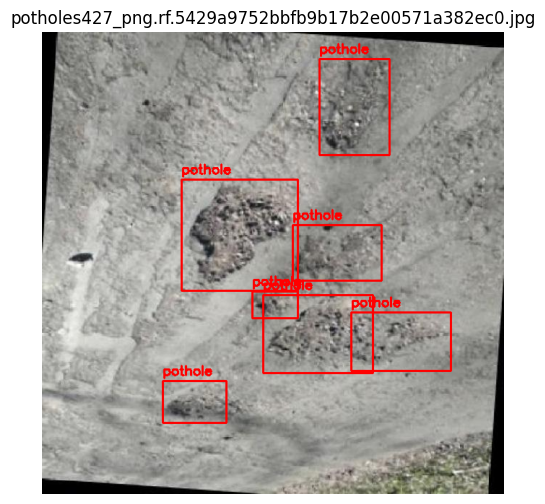

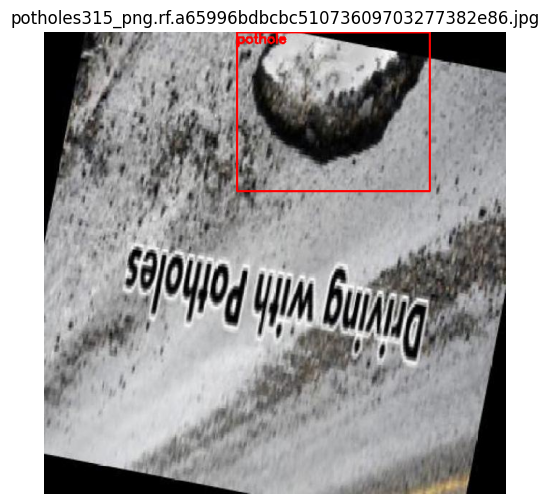

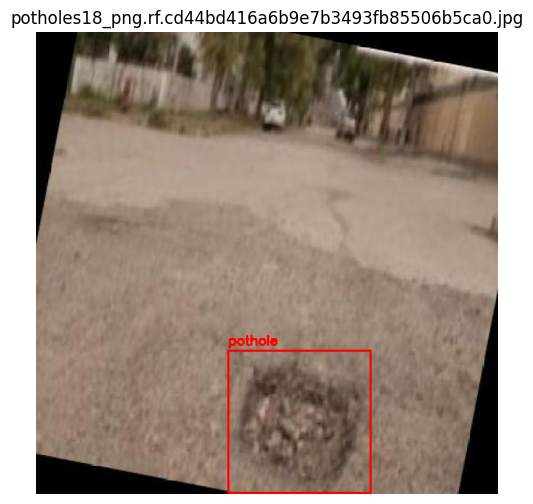

In [ ]:
# ============================================
# VISUAL DATASET SANITY CHECK
# ============================================

import os
import random
import cv2
import matplotlib.pyplot as plt

train_images = os.path.join(dataset_path, "train", "images")
train_labels = os.path.join(dataset_path, "train", "labels")

image_files = [
    f for f in os.listdir(train_images)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
]

# Select 3 random training images
samples = random.sample(image_files, min(3, len(image_files)))

print("=== VISUAL DATASET CHECK ===")
print("Training images available:", len(image_files))
print("Showing:", len(samples), "random samples")

for filename in samples:
    image_path = os.path.join(train_images, filename)
    label_path = os.path.join(
        train_labels,
        os.path.splitext(filename)[0] + ".txt"
    )

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    h, w = image.shape[:2]

    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            lines = f.readlines()

        for line in lines:
            parts = line.strip().split()

            if len(parts) != 5:
                continue

            cls, xc, yc, bw, bh = map(float, parts)

            # YOLO normalized coordinates -> pixels
            x1 = int((xc - bw / 2) * w)
            y1 = int((yc - bh / 2) * h)
            x2 = int((xc + bw / 2) * w)
            y2 = int((yc + bh / 2) * h)

            cv2.rectangle(
                image,
                (x1, y1),
                (x2, y2),
                (255, 0, 0),
                2
            )

            cv2.putText(
                image,
                "pothole",
                (x1, max(y1 - 8, 15)),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.6,
                (255, 0, 0),
                2
            )

    plt.figure(figsize=(10, 6))
    plt.imshow(image)
    plt.title(filename)
    plt.axis("off")
    plt.show()

In [ ]:
# ============================================
# PaveXa YOLOv12m FINE-TUNING CONFIGURATION
# ============================================

from ultralytics import YOLO
import os
import torch

# -----------------------------
# Paths
# -----------------------------

checkpoint = (
    "/content/drive/MyDrive/"
    "PaveXa_YOLOv12m_Checkpoints/"
    "yolov12m_5class_40epochs_best_backup.pt"
)

data_yaml = (
    "/content/drive/MyDrive/"
    "PaveXa_Kaggle_Pothole_Dataset/"
    "data.yaml"
)

# Persistent training output on Google Drive
project_dir = (
    "/content/drive/MyDrive/"
    "PaveXa_YOLOv12m_Checkpoints"
)

run_name = "pothole_finetune_yolov12m"

# -----------------------------
# Verify paths
# -----------------------------

print("=== TRAINING CONFIGURATION ===")

print("Checkpoint exists:", os.path.exists(checkpoint))
print("Dataset YAML exists:", os.path.exists(data_yaml))
print("Project directory exists:", os.path.exists(project_dir))

# -----------------------------
# GPU
# -----------------------------

print("\nGPU:", torch.cuda.get_device_name(0))
print(
    "VRAM:",
    f"{torch.cuda.get_device_properties(0).total_memory / (1024**3):.2f} GB"
)

# -----------------------------
# Training parameters
# -----------------------------

epochs = 40
imgsz = 640

# Conservative starting batch size for YOLOv12m on T4
batch = 8

# Save a checkpoint every 5 epochs
save_period = 5

device = 0

print("\n=== PARAMETERS ===")
print("Epochs:", epochs)
print("Image size:", imgsz)
print("Batch size:", batch)
print("Device:", device)
print("Checkpoint interval:", save_period, "epochs")
print("Run name:", run_name)

print("\n=== PERSISTENCE ===")
print("Training outputs will be saved to:")
print(project_dir)

print("\n✅ Configuration prepared.")
print("⚠️ NO TRAINING STARTED.")

=== TRAINING CONFIGURATION ===
Checkpoint exists: True
Dataset YAML exists: True
Project directory exists: True

GPU: Tesla T4
VRAM: 14.56 GB

=== PARAMETERS ===
Epochs: 40
Image size: 640
Batch size: 8
Device: 0
Checkpoint interval: 5 epochs
Run name: pothole_finetune_yolov12m

=== PERSISTENCE ===
Training outputs will be saved to:
/content/drive/MyDrive/PaveXa_YOLOv12m_Checkpoints

✅ Configuration prepared.
⚠️ NO TRAINING STARTED.


In [ ]:
# ============================================
# 1-EPOCH TRAINING SANITY TEST
# ============================================

print("Starting 1-epoch sanity test...")
print("This is NOT the full training run.")

test_model = YOLO(checkpoint)

test_model.train(
    data=data_yaml,
    epochs=1,
    imgsz=imgsz,
    batch=batch,
    device=device,
    workers=2,
    project=project_dir,
    name="sanity_test",
    exist_ok=True,
    save=True,
    verbose=True
)

print("\n✅ 1-EPOCH SANITY TEST COMPLETED.")

Starting 1-epoch sanity test...
This is NOT the full training run.
Ultralytics 8.4.126 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/PaveXa_Kaggle_Pothole_Dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=1, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, mo

In [ ]:
# ============================================
# YOLOv12m → Pothole Fine-Tuning
# 20-Epoch Training Run
# ============================================

from ultralytics import YOLO
import os
import torch

# Original YOLOv12m checkpoint
checkpoint = "/content/drive/MyDrive/PaveXa_YOLOv12m_Checkpoints/yolov12m_5class_40epochs_best_backup.pt"

# Persistent dataset
data_yaml = "/content/drive/MyDrive/PaveXa_Kaggle_Pothole_Dataset/data.yaml"

# Persistent output directory
project_dir = "/content/drive/MyDrive/PaveXa_YOLOv12m_Checkpoints"

# Load original YOLOv12m checkpoint
model = YOLO(checkpoint)

print("============================================")
print("STARTING 20-EPOCH POTHOLE FINE-TUNING")
print("============================================")

print("GPU:", torch.cuda.get_device_name(0))
print("VRAM:", f"{torch.cuda.get_device_properties(0).total_memory / (1024**3):.2f} GB")

print("\nCheckpoint:", checkpoint)
print("Dataset:", data_yaml)

# Train
results = model.train(
    data=data_yaml,

    epochs=20,
    imgsz=640,
    batch=8,
    device=0,

    # Save checkpoints every 5 epochs
    save_period=5,

    # Persistent storage
    project=project_dir,
    name="pothole_finetune_20ep",

    # Data loading
    workers=2,

    # Reproducibility
    seed=42,

    # Keep best model
    patience=20,

    # Don't overwrite an existing run
    exist_ok=True
)

print("\n============================================")
print("20-EPOCH TRAINING COMPLETED")
print("============================================")
print("Results saved to:")
print(f"{project_dir}/pothole_finetune_20ep")

STARTING 20-EPOCH POTHOLE FINE-TUNING
GPU: Tesla T4
VRAM: 14.56 GB

Checkpoint: /content/drive/MyDrive/PaveXa_YOLOv12m_Checkpoints/yolov12m_5class_40epochs_best_backup.pt
Dataset: /content/drive/MyDrive/PaveXa_Kaggle_Pothole_Dataset/data.yaml
Ultralytics 8.4.126 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/PaveXa_Kaggle_Pothole_Dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=20, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, fre

In [ ]:
from ultralytics import YOLO
import os

# Your trained 20-epoch best model
best_model_path = "/content/drive/MyDrive/PaveXa_YOLOv12m_Checkpoints/pothole_finetune_20ep/weights/best.pt"

# Dataset configuration
data_yaml = "/content/drive/MyDrive/PaveXa_Kaggle_Pothole_Dataset/data.yaml"

print("Model exists:", os.path.exists(best_model_path))
print("Dataset YAML exists:", os.path.exists(data_yaml))

model = YOLO(best_model_path)

print("\n✅ Best model loaded successfully!")
print("Model classes:", model.names)

Model exists: True
Dataset YAML exists: True

✅ Best model loaded successfully!
Model classes: {0: 'pothole'}


In [ ]:
# ============================================
# PaveXa YOLOv12m — TEST SET EVALUATION
# ============================================

test_results = model.val(
    data=data_yaml,
    split="test",
    imgsz=640,
    batch=8,
    device=0
)

print("\n============================================")
print("PaveXa TEST SET RESULTS")
print("============================================")
print(f"Precision : {test_results.box.mp:.4f}")
print(f"Recall    : {test_results.box.mr:.4f}")
print(f"mAP50     : {test_results.box.map50:.4f}")
print(f"mAP50-95  : {test_results.box.map:.4f}")

Ultralytics 8.4.126 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLOv12m summary (fused): 169 layers, 20,105,683 parameters, 0 gradients, 70.4 GFLOPs
WARNING ⚠️ val: Slow image access detected (ping: 1.8±2.7 ms, read: 10.0±9.1 MB/s, size: 55.1 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips
val: Scanning /content/drive/MyDrive/PaveXa_Kaggle_Pothole_Dataset/test/labels... 198 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 198/198 245.1it/s 0.8s
val: New cache created: /content/drive/MyDrive/PaveXa_Kaggle_Pothole_Dataset/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 25/25 3.0it/s 8.4s
                   all        198        433      0.889      0.861      0.924      0.659
Speed: 2.0ms preprocess, 35.2ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to /content/runs/detect/va

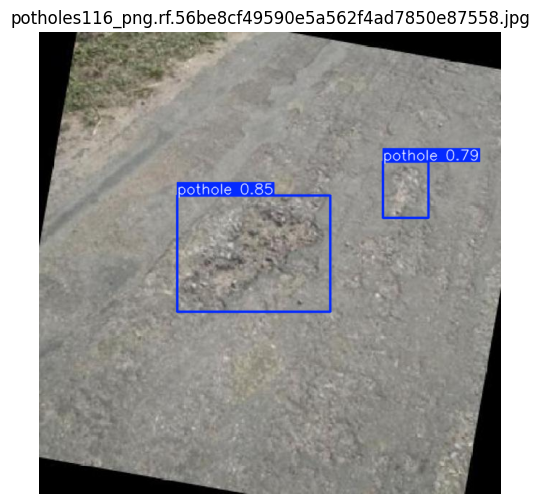

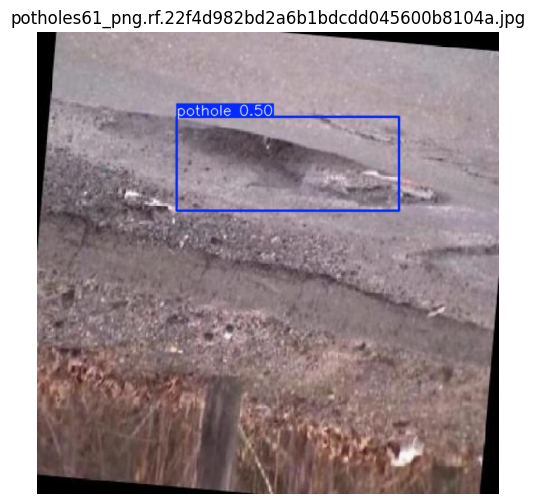

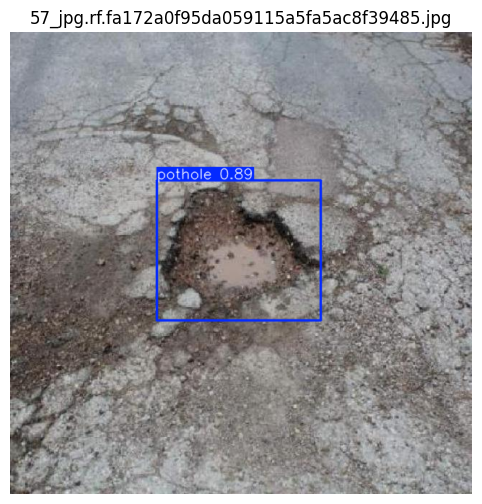

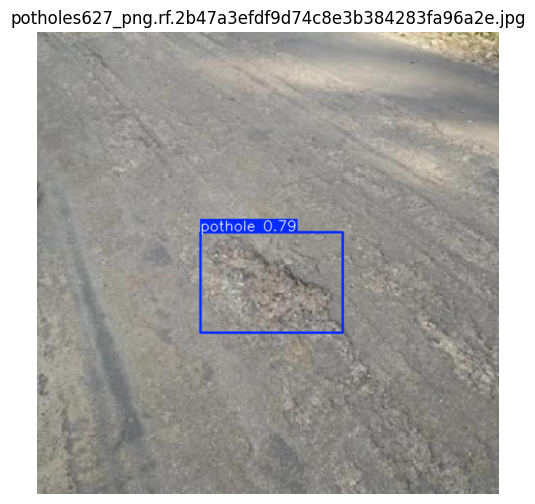

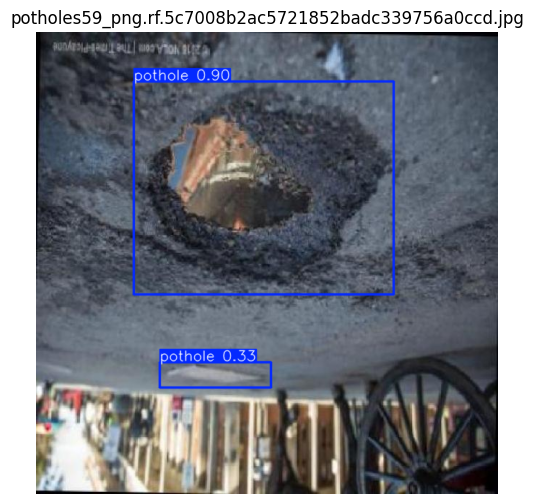

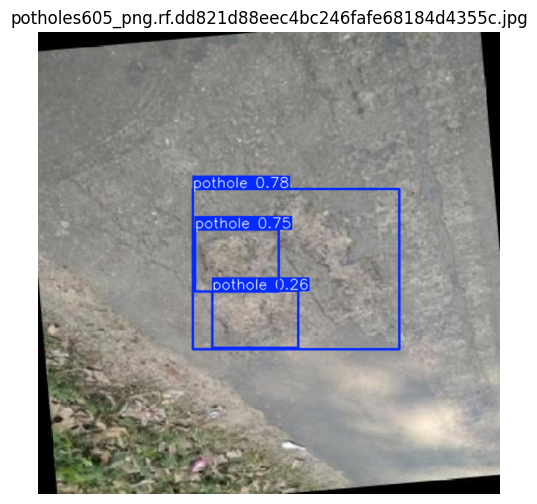

In [ ]:
# ============================================
# PaveXa - Visual Test on Unseen Test Images
# ============================================

import random
import matplotlib.pyplot as plt

test_images_dir = "/content/drive/MyDrive/PaveXa_Kaggle_Pothole_Dataset/test/images"

# Pick 6 random test images
image_files = [
    os.path.join(test_images_dir, f)
    for f in os.listdir(test_images_dir)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
]

random.seed(42)
sample_images = random.sample(image_files, min(6, len(image_files)))

# Run inference
results = model.predict(
    source=sample_images,
    imgsz=640,
    conf=0.25,
    device=0,
    save=False,
    verbose=False
)

# Display predictions
for image_path, result in zip(sample_images, results):
    plotted = result.plot()

    plt.figure(figsize=(8, 6))
    plt.imshow(plotted[:, :, ::-1])
    plt.title(os.path.basename(image_path))
    plt.axis("off")
    plt.show()

In [ ]:
from google.colab import files
from ultralytics import YOLO
import os

# Load your trained model
model = YOLO(
    "/content/drive/MyDrive/PaveXa_YOLOv12m_Checkpoints/"
    "pothole_finetune_20ep/weights/best.pt"
)

# Select MULTIPLE images
uploaded = files.upload()

# Get uploaded image paths
image_paths = list(uploaded.keys())

print(f"\nUploaded {len(image_paths)} image(s)")
for img in image_paths:
    print(" -", img)

# Run prediction on ALL uploaded images
results = model.predict(
    source=image_paths,
    imgsz=640,
    conf=0.25,
    save=True
)

print("\n✅ Prediction completed for all images!")
print("Results saved to:", results[0].save_dir)

Saving images (11).jpg to images (11).jpg
Saving images (10).jpg to images (10).jpg
Saving images (9).jpg to images (9).jpg
Saving images (8).jpg to images (8).jpg
Saving images (7).jpg to images (7).jpg
Saving images (6).jpg to images (6).jpg
Saving images (5).jpg to images (5).jpg
Saving images (4).jpg to images (4).jpg
Saving images (3).jpg to images (3).jpg
Saving images (2).jpg to images (2).jpg
Saving images (1).jpg to images (1).jpg
Saving Potholes-resized-for-blog.jpg to Potholes-resized-for-blog.jpg
Saving Dirtroadpotholes.JPG to Dirtroadpotholes.JPG
Saving potholes2.webp to potholes2.webp

Uploaded 14 image(s)
 - images (11).jpg
 - images (10).jpg
 - images (9).jpg
 - images (8).jpg
 - images (7).jpg
 - images (6).jpg
 - images (5).jpg
 - images (4).jpg
 - images (3).jpg
 - images (2).jpg
 - images (1).jpg
 - Potholes-resized-for-blog.jpg
 - Dirtroadpotholes.JPG
 - potholes2.webp

0: 640x640 1 pothole, 27.3ms
1: 640x640 (no detections), 27.3ms
2: 640x640 2 potholes, 27.3ms
3:

Showing 14 predicted images...

Dirtroadpotholes.jpg


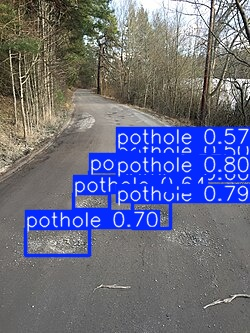

Potholes-resized-for-blog.jpg


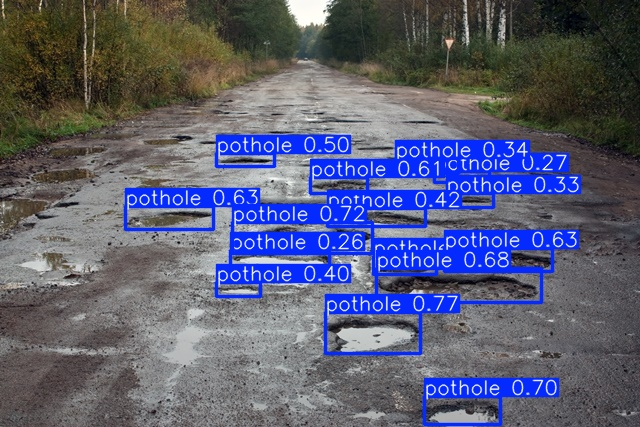

images (1).jpg


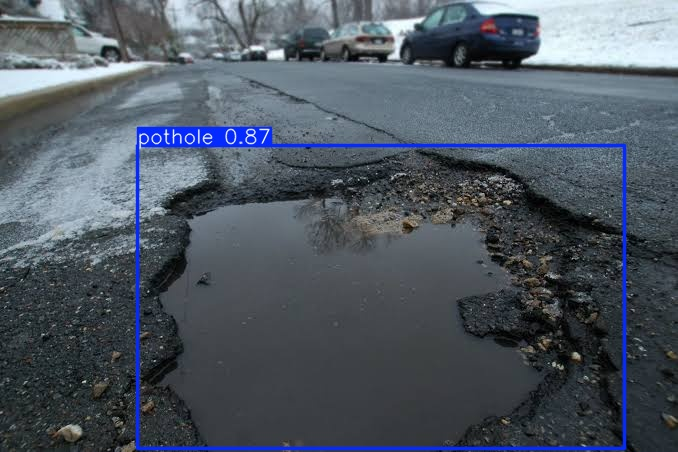

images (10).jpg


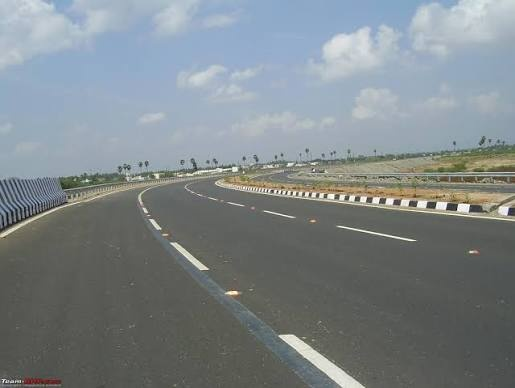

images (11).jpg


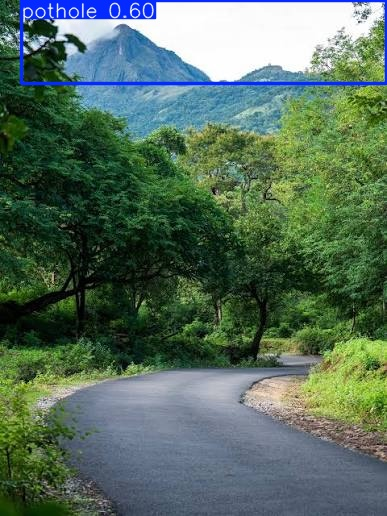

images (2).jpg


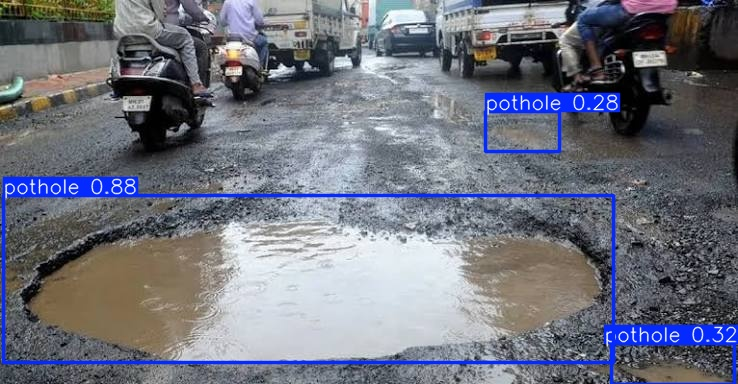

images (3).jpg


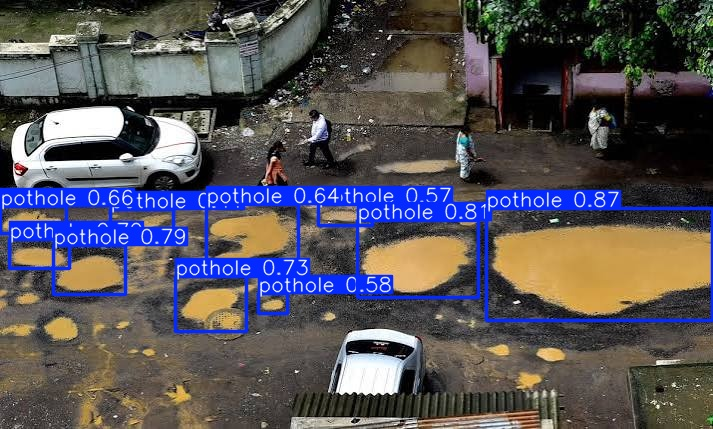

images (4).jpg


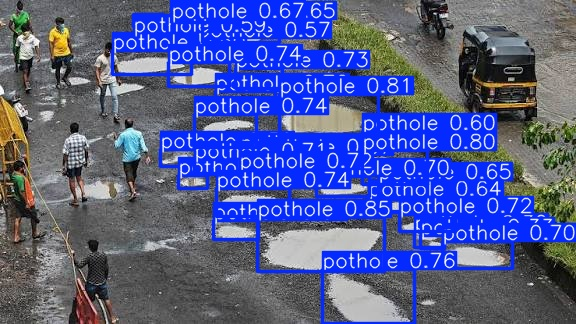

images (5).jpg


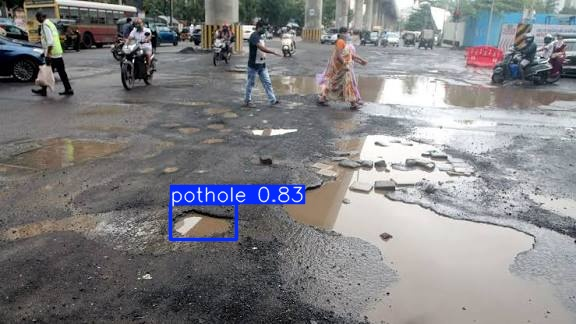

images (6).jpg


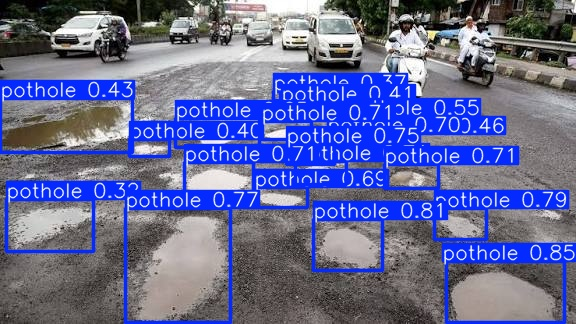

images (7).jpg


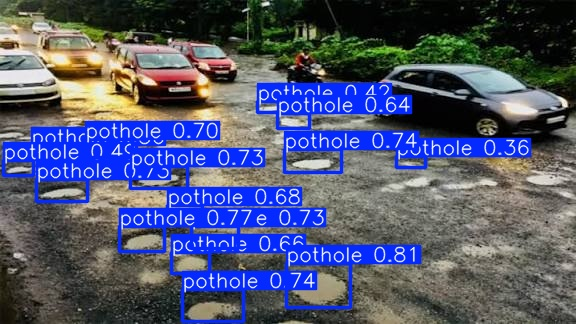

images (8).jpg


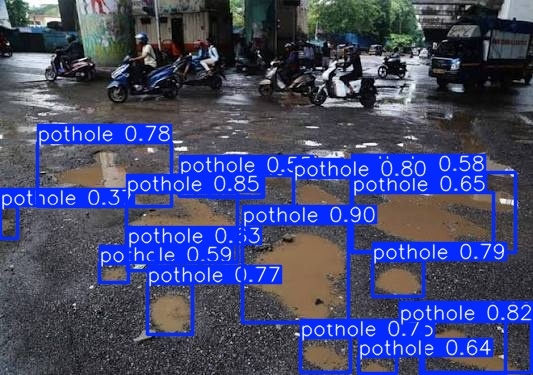

images (9).jpg


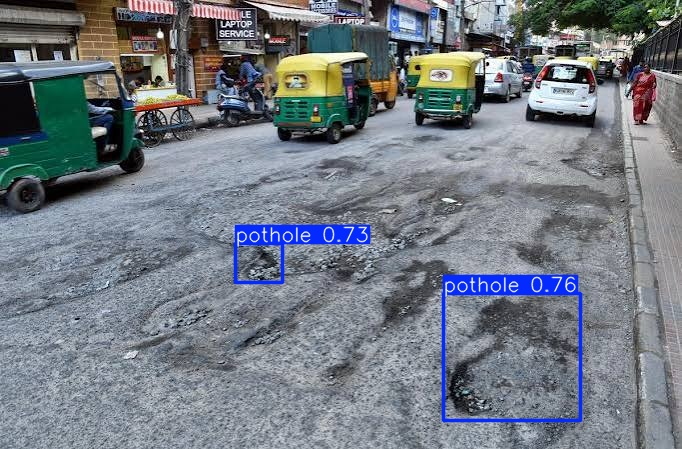

potholes2.jpg


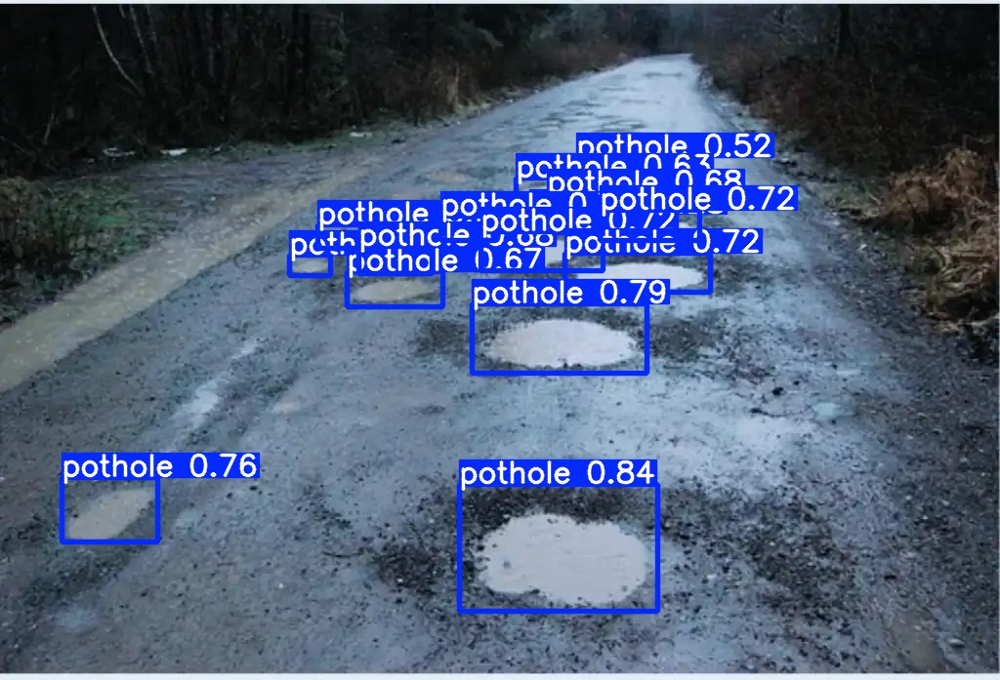

In [ ]:
from IPython.display import display
from PIL import Image
import glob
import os

result_dir = "/content/runs/detect/predict"

output_images = sorted(glob.glob(os.path.join(result_dir, "*.jpg")))

print(f"Showing {len(output_images)} predicted images...\n")

for path in output_images:
    print("=" * 60)
    print(os.path.basename(path))
    display(Image.open(path))